In [ ]:
import torch
import torch.nn as nn
from torchvision import datasets, transforms, utils
from tqdm.auto import tqdm
import torch.nn.functional as F
import matplotlib.pyplot as plt
import numpy as np
import math

In [ ]:
# This UNET-style prediction model was originally included as part of the Score-based generative modelling tutorial
# by Yang Song et al: https://colab.research.google.com/drive/120kYYBOVa1i0TD85RjlEkFjaWDxSFUx3?usp=sharing

class GaussianFourierProjection(nn.Module):
  """Gaussian random features for encoding time steps."""
  def __init__(self, embed_dim, scale=30.):
    super().__init__()
    # Randomly sample weights during initialization. These weights are fixed
    # during optimization and are not trainable.
    self.W = nn.Parameter(torch.randn(embed_dim // 2) * scale, requires_grad=False)
  def forward(self, x):
    x_proj = x[:, None] * self.W[None, :] * 2 * np.pi
    return torch.cat([torch.sin(x_proj), torch.cos(x_proj)], dim=-1)


class Dense(nn.Module):
  """A fully connected layer that reshapes outputs to feature maps."""
  def __init__(self, input_dim, output_dim):
    super().__init__()
    self.dense = nn.Linear(input_dim, output_dim)
  def forward(self, x):
    return self.dense(x)[..., None, None]


class ScoreNet(nn.Module):
  """A time-dependent score-based model built upon U-Net architecture."""

  def __init__(self, marginal_prob_std, channels=[32, 64, 128, 256], embed_dim=256):
    """Initialize a time-dependent score-based network.

    Args:
      marginal_prob_std: A function that takes time t and gives the standard
        deviation of the perturbation kernel p_{0t}(x(t) | x(0)).
      channels: The number of channels for feature maps of each resolution.
      embed_dim: The dimensionality of Gaussian random feature embeddings.
    """
    super().__init__()
    # Gaussian random feature embedding layer for time
    self.embed = nn.Sequential(GaussianFourierProjection(embed_dim=embed_dim),
         nn.Linear(embed_dim, embed_dim))
    # Encoding layers where the resolution decreases
    self.conv1 = nn.Conv2d(1, channels[0], 3, stride=1, bias=False)
    self.dense1 = Dense(embed_dim, channels[0])
    self.gnorm1 = nn.GroupNorm(4, num_channels=channels[0])
    self.conv2 = nn.Conv2d(channels[0], channels[1], 3, stride=2, bias=False)
    self.dense2 = Dense(embed_dim, channels[1])
    self.gnorm2 = nn.GroupNorm(32, num_channels=channels[1])
    self.conv3 = nn.Conv2d(channels[1], channels[2], 3, stride=2, bias=False)
    self.dense3 = Dense(embed_dim, channels[2])
    self.gnorm3 = nn.GroupNorm(32, num_channels=channels[2])
    self.conv4 = nn.Conv2d(channels[2], channels[3], 3, stride=2, bias=False)
    self.dense4 = Dense(embed_dim, channels[3])
    self.gnorm4 = nn.GroupNorm(32, num_channels=channels[3])

    # Decoding layers where the resolution increases
    self.tconv4 = nn.ConvTranspose2d(channels[3], channels[2], 3, stride=2, bias=False)
    self.dense5 = Dense(embed_dim, channels[2])
    self.tgnorm4 = nn.GroupNorm(32, num_channels=channels[2])
    self.tconv3 = nn.ConvTranspose2d(channels[2] + channels[2], channels[1], 3, stride=2, bias=False, output_padding=1)
    self.dense6 = Dense(embed_dim, channels[1])
    self.tgnorm3 = nn.GroupNorm(32, num_channels=channels[1])
    self.tconv2 = nn.ConvTranspose2d(channels[1] + channels[1], channels[0], 3, stride=2, bias=False, output_padding=1)
    self.dense7 = Dense(embed_dim, channels[0])
    self.tgnorm2 = nn.GroupNorm(32, num_channels=channels[0])
    self.tconv1 = nn.ConvTranspose2d(channels[0] + channels[0], 1, 3, stride=1)

    # The swish activation function
    self.act = lambda x: x * torch.sigmoid(x)
    self.marginal_prob_std = marginal_prob_std

  def forward(self, x, t):
    # Obtain the Gaussian random feature embedding for t
    embed = self.act(self.embed(t))
    # Encoding path
    h1 = self.conv1(x)
    ## Incorporate information from t
    h1 += self.dense1(embed)
    ## Group normalization
    h1 = self.gnorm1(h1)
    h1 = self.act(h1)
    h2 = self.conv2(h1)
    h2 += self.dense2(embed)
    h2 = self.gnorm2(h2)
    h2 = self.act(h2)
    h3 = self.conv3(h2)
    h3 += self.dense3(embed)
    h3 = self.gnorm3(h3)
    h3 = self.act(h3)
    h4 = self.conv4(h3)
    h4 += self.dense4(embed)
    h4 = self.gnorm4(h4)
    h4 = self.act(h4)

    # Decoding path
    h = self.tconv4(h4)
    ## Skip connection from the encoding path
    h += self.dense5(embed)
    h = self.tgnorm4(h)
    h = self.act(h)
    h = self.tconv3(torch.cat([h, h3], dim=1))
    h += self.dense6(embed)
    h = self.tgnorm3(h)
    h = self.act(h)
    h = self.tconv2(torch.cat([h, h2], dim=1))
    h += self.dense7(embed)
    h = self.tgnorm2(h)
    h = self.act(h)
    h = self.tconv1(torch.cat([h, h1], dim=1))

    # Normalize output
    h = h / self.marginal_prob_std(t)[:, None, None, None]
    return h

In [ ]:
# ExponentialMovingAverage implementation as used in pytorch vision
# https://github.com/pytorch/vision/blob/main/references/classification/utils.py#L159

# BSD 3-Clause License

# Copyright (c) Soumith Chintala 2016,
# All rights reserved.

# Redistribution and use in source and binary forms, with or without
# modification, are permitted provided that the following conditions are met:

# * Redistributions of source code must retain the above copyright notice, this
#   list of conditions and the following disclaimer.

# * Redistributions in binary form must reproduce the above copyright notice,
#   this list of conditions and the following disclaimer in the documentation
#   and/or other materials provided with the distribution.

# * Neither the name of the copyright holder nor the names of its
#   contributors may be used to endorse or promote products derived from
#   this software without specific prior written permission.

# THIS SOFTWARE IS PROVIDED BY THE COPYRIGHT HOLDERS AND CONTRIBUTORS "AS IS"
# AND ANY EXPRESS OR IMPLIED WARRANTIES, INCLUDING, BUT NOT LIMITED TO, THE
# IMPLIED WARRANTIES OF MERCHANTABILITY AND FITNESS FOR A PARTICULAR PURPOSE ARE
# DISCLAIMED. IN NO EVENT SHALL THE COPYRIGHT HOLDER OR CONTRIBUTORS BE LIABLE
# FOR ANY DIRECT, INDIRECT, INCIDENTAL, SPECIAL, EXEMPLARY, OR CONSEQUENTIAL
# DAMAGES (INCLUDING, BUT NOT LIMITED TO, PROCUREMENT OF SUBSTITUTE GOODS OR
# SERVICES; LOSS OF USE, DATA, OR PROFITS; OR BUSINESS INTERRUPTION) HOWEVER
# CAUSED AND ON ANY THEORY OF LIABILITY, WHETHER IN CONTRACT, STRICT LIABILITY,
# OR TORT (INCLUDING NEGLIGENCE OR OTHERWISE) ARISING IN ANY WAY OUT OF THE USE
# OF THIS SOFTWARE, EVEN IF ADVISED OF THE POSSIBILITY OF SUCH DAMAGE.

class ExponentialMovingAverage(torch.optim.swa_utils.AveragedModel):
    """Maintains moving averages of model parameters using an exponential decay.
    ``ema_avg = decay * avg_model_param + (1 - decay) * model_param``
    `torch.optim.swa_utils.AveragedModel <https://pytorch.org/docs/stable/optim.html#custom-averaging-strategies>`_
    is used to compute the EMA.
    """

    def __init__(self, model, decay, device="cpu"):
        def ema_avg(avg_model_param, model_param, num_averaged):
            return decay * avg_model_param + (1 - decay) * model_param

        super().__init__(model, device, ema_avg, use_buffers=True)

In [ ]:
"""2.0"""


class DDPM(nn.Module):

    def __init__(self, network, T=100, beta_1=1e-4, beta_T=2e-2, mode = 'epsilon'):
        """
        Initialize Denoising Diffusion Probabilistic Model

        Parameters
        ----------
        network: nn.Module
            The inner neural network used by the diffusion process. Typically a Unet.
        beta_1: float
            beta_t value at t=1
        beta_T: [float]
            beta_t value at t=T (last step)
        T: int
            The number of diffusion steps
        mode: string
            'epsilon', 'mu' or 'x0'
            Sets the model into one of three possible prediction modes.
        """

        super(DDPM, self).__init__()

        # Normalize time input before evaluating neural network
        # Reshape input into image format and normalize time value before sending it to network model
        self._network = network
        self.network = lambda x, t: (self._network(x.reshape(-1, 1, 28, 28),
                                                   (t.squeeze()/T))
                                    ).reshape(-1, 28*28)

        # Total number of time steps
        self.T = T
        self.mode = mode

        # Registering as buffers to ensure they get transferred to the GPU automatically
        betas = torch.linspace(beta_1, beta_T, T+1)
        alphas = 1. - betas
        alphas_bar = torch.cumprod(alphas, dim = 0)
        self.register_buffer("beta", betas)
        self.register_buffer("alpha", alphas)
        self.register_buffer("alpha_bar", alphas_bar)

    def forward_diffusion(self, x0, t, epsilon):
        '''
        q(x_t | x_0)
        Forward diffusion from an input datapoint x0 to an xt at timestep t, provided a N(0,1) noise sample epsilon.
        Note that we can do this operation in a single step

        Parameters
        ----------
        x0: torch.tensor
            x value at t=0 (an input image)
        t: int
            step index
        epsilon:
            noise sample

        Returns
        -------
        torch.tensor
            image at timestep t
        '''

        mean = torch.sqrt(self.alpha_bar[t])*x0
        std = torch.sqrt(1.0 - self.alpha_bar[t])

        return mean + std*epsilon
        # similar to the reparametrization trick in VAE
        # we approximate x_t as a sum of fixed mean vector and fixed std vector times random noise
        # meaning we denote x_t as a sum of deterministic and stochastic term
        # mean tells us how much of the total information is retained from  x_0  up to time t

    def reverse_diffusion(self, xt, t, epsilon):
        """
        p(x_{t-1} | x_t)
        Single step in the reverse direction, from x_t (at timestep t) to x_{t-1}, provided a N(0,1) noise sample epsilon.

        Parameters
        ----------
        xt: torch.tensor
            x value at step t
        t: int
            step index
        epsilon:
            noise sample

        Returns
        -------
        torch.tensor
            image at timestep t-1
        """

        if self.mode == 'epsilon':
          # Predicting for noise
          mean =  1./torch.sqrt(self.alpha[t]) * (xt - (self.beta[t])/torch.sqrt(1-self.alpha_bar[t])*self.network(xt, t))
          std = torch.where(t>0, torch.sqrt(((1-self.alpha_bar[t-1]) / (1-self.alpha_bar[t]))*self.beta[t]), 0)

          return mean + std*epsilon

        elif self.mode == 'x0':
          # Predicting x0
          x0_pred = self.network(xt, t)

          # We use the posterior-mean formula from eq. 7 in Ho et al.
          # mu = c1*x0_pred + c2*x_t
          # with coef1 = (sqrt(alpha_bar[t-1])*beta[t])/(1 - alpha[t])
          # coef2 = (sqrt(alpha[t])*(1-alpha_bar[t-1]))/(1 - alpha_bar[t])

          # Computing mean for reverse process
          coef1 = (torch.sqrt(self.alpha_bar[t-1]) * self.beta[t]) / (1. - self.alpha_bar[t])
          coef2 = (torch.sqrt(self.alpha[t]) * (1 - self.alpha_bar[t-1]) / (1. - self.alpha_bar[t]))
          mean = coef1 * x0_pred + coef2 * xt
          std = torch.where(t>0, torch.sqrt(((1 - self.alpha_bar[t-1]) / (1 - self.alpha_bar[t])) * self.beta[t]), torch.tensor(0., device = xt.device).expand_as(mean))

          return mean + std * epsilon

        else:
          # Predicting the mean
          mu_pred = self.network(xt, t)
          std = torch.sqrt(torch.where(t>0, ((1 - self.alpha_bar[t-1]) / (1- self.alpha_bar[t])) * self.beta[t], torch.tensor(0., device = xt.device)))

          return mu_pred + std*epsilon

    @torch.no_grad()
    def sample(self, shape):
        """
        Sample from diffusion model (Algorithm 2 in Ho et al, 2020)

        Parameters
        ----------
        shape: tuple
            Specify shape of sampled output. For MNIST: (nsamples, 28*28)

        Returns
        -------
        torch.tensor
            sampled image
        """

        # Sample xT: Gaussian noise
        xT = torch.randn(shape).to(self.beta.device)

        xt = xT

        for t in range(self.T, 0, -1):
            noise = torch.randn_like(xT) if t > 1 else 0
            t = torch.tensor(t).expand(xt.shape[0], 1).to(self.beta.device)
            xt = self.reverse_diffusion(xt, t, noise)

        return xt

    def elbo_simple(self, x0):
        """
        ELBO training objective (Algorithm 1 in Ho et al, 2020)

        Parameters
        ----------
        x0: torch.tensor
            Input image

        Returns
        -------
        float
            ELBO value
        """

        # Sample time step t
        t = torch.randint(1, self.T, (x0.shape[0],1)).to(x0.device)

        # Sample noise
        epsilon = torch.randn_like(x0)

        # TODO: Forward diffusion to produce image at step t
        xt = self.forward_diffusion(x0, t, epsilon)

        if self.mode == 'epsilon':
            # Loss while predicting noise
            epsilon_pred = self.network(xt, t)
            #return -nn.MSELoss(reduction='mean')(epsilon, self.network(xt, t))
            return -nn.MSELoss(reduction='mean')(epsilon, epsilon_pred)

        elif self.mode == 'x0':
          x0_pred = self.network(xt, t)
          return -nn.MSELoss(reduction='mean')(x0, x0_pred)

        else:
          raise ValueError('Elbo_simple should not be called for mode == "mu"')



    def loss(self, x0):
        """
        Loss function. Just the negative of the ELBO for epsilon and x0,
        and variance-weighted KL for mu.
        """
        if self.mode in ['epsilon', 'x0']:
          return -self.elbo_simple(x0).mean()

        elif self.mode == 'mu':
          return self.full_mu_loss(x0)



In [ ]:
def train(model, optimizer, scheduler, dataloader, epochs, device, ema=True, per_epoch_callback=None):
    """
    Training loop

    Parameters
    ----------
    model: nn.Module
        Pytorch model
    optimizer: optim.Optimizer
        Pytorch optimizer to be used for training
    scheduler: optim.LRScheduler
        Pytorch learning rate scheduler
    dataloader: utils.DataLoader
        Pytorch dataloader
    epochs: int
        Number of epochs to train
    device: torch.device
        Pytorch device specification
    ema: Boolean
        Whether to activate Exponential Model Averaging
    per_epoch_callback: function
        Called at the end of every epoch
    """

    # Setup progress bar
    total_steps = len(dataloader)*epochs
    progress_bar = tqdm(range(total_steps), desc="Training")

    if ema:
        ema_global_step_counter = 0
        ema_steps = 10
        ema_adjust = dataloader.batch_size * ema_steps / epochs
        ema_decay = 1.0 - 0.995
        ema_alpha = min(1.0, (1.0 - ema_decay) * ema_adjust)
        ema_model = ExponentialMovingAverage(model, device=device, decay=1.0 - ema_alpha)

    train_loss_list = []
    for epoch in range(epochs):
      # Switch to train mode
      model.train()
      epoch_loss_sum = 0.0

      for i, (x, _) in enumerate(dataloader):
          x = x.to(device)
          optimizer.zero_grad()
          loss = model.loss(x)
          loss.backward()
          optimizer.step()
          scheduler.step()

          # Update progress bar
          progress_bar.set_postfix(loss=f"⠀{loss.item():12.4f}", epoch=f"{epoch+1}/{epochs}", lr=f"{scheduler.get_last_lr()[0]:.2E}")
          progress_bar.update()

          if ema:
              ema_global_step_counter += 1
              if ema_global_step_counter%ema_steps==0:
                  ema_model.update_parameters(model)

          # Accumulating loss
          epoch_loss_sum += loss.item()

      # Calculating average loss for the epoch
      avg_loss_epoch = epoch_loss_sum / len(dataloader)
      train_loss_list.append(avg_loss_epoch)

      if per_epoch_callback:
          per_epoch_callback(ema_model.module if ema else model, train_loss_list)

In [ ]:
# Parameters
T = 1000
learning_rate = 1e-3
epochs = 100
batch_size = 256


# Rather than treating MNIST images as discrete objects, as done in Ho et al 2020,
# we here treat them as continuous input data, by dequantizing the pixel values (adding noise to the input data)
# Also note that we map the 0..255 pixel values to [-1, 1], and that we process the 28x28 pixel values as a flattened 784 tensor.
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Lambda(lambda x: x + torch.rand(x.shape)/255),    # Dequantize pixel values
    transforms.Lambda(lambda x: (x-0.5)*2.0),                    # Map from [0,1] -> [-1, -1]
    transforms.Lambda(lambda x: x.flatten())
])

# Download and transform train dataset
dataloader_train = torch.utils.data.DataLoader(datasets.MNIST('./mnist_data', download=True, train=True, transform=transform),
                                                batch_size=batch_size,
                                                shuffle=True, num_workers=4)

# Select device
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

# Construct Unet
# The original ScoreNet expects a function with std for all the
# different noise levels, such that the output can be rescaled.
# Since we are predicting the noise (rather than the score), we
# ignore this rescaling and just set std=1 for all t.
mnist_unet = ScoreNet((lambda t: torch.ones(1).to(device)))

def reporter():
    """Callback function used for plotting images during training"""
    def callback_fn(model, train_loss_list):
      # Switch to eval mode
      model.eval()

      with torch.no_grad():
          nsamples = 10
          samples = model.sample((nsamples,28*28)).cpu()

          # Map pixel values back from [-1,1] to [0,1]
          samples = (samples+1)/2
          samples = samples.clamp(0.0, 1.0)

          # Plot in grid
          grid = utils.make_grid(samples.reshape(-1, 1, 28, 28), nrow=nsamples)
          plt.gca().set_axis_off()
          plt.imshow(transforms.functional.to_pil_image(grid), cmap="gray")
          plt.show()

      # Plotting the training-loss curve
      plt.plot(figsize = (6,6))
      plt.plot(train_loss_list, label = "Training loss")
      plt.xlabel("Epoch")
      plt.ylabel("Loss")
      plt.legend()
      plt.tight_layout()
      plt.show()

    return callback_fn

Failed to download (trying next):
<urlopen error [Errno 110] Connection timed out>



100%|██████████| 9.91M/9.91M [00:02<00:00, 4.62MB/s]


Extracting ./mnist_data/MNIST/raw/train-images-idx3-ubyte.gz to ./mnist_data/MNIST/raw

Failed to download (trying next):
<urlopen error [Errno 110] Connection timed out>



100%|██████████| 28.9k/28.9k [00:00<00:00, 53.6kB/s]


Extracting ./mnist_data/MNIST/raw/train-labels-idx1-ubyte.gz to ./mnist_data/MNIST/raw

Failed to download (trying next):
<urlopen error [Errno 110] Connection timed out>



100%|██████████| 1.65M/1.65M [00:06<00:00, 236kB/s]


Extracting ./mnist_data/MNIST/raw/t10k-images-idx3-ubyte.gz to ./mnist_data/MNIST/raw

Failed to download (trying next):
<urlopen error [Errno 110] Connection timed out>



100%|██████████| 4.54k/4.54k [00:00<00:00, 5.92MB/s]

Extracting ./mnist_data/MNIST/raw/t10k-labels-idx1-ubyte.gz to ./mnist_data/MNIST/raw



## Training models

In [ ]:
'''model_mu = DDPM(mnist_unet, T = T, mode = 'mu').to(device)

print("Training in mode: mu")
optimizer = torch.optim.Adam(model_mu.parameters(), lr=1e-3)
scheduler = torch.optim.lr_scheduler.ExponentialLR(optimizer, 0.9999)
train(model_mu, optimizer, scheduler, dataloader_train, epochs = epochs, device = device, ema = True, per_epoch_callback = reporter)'''

'model_mu = DDPM(mnist_unet, T = T, mode = \'mu\').to(device)\n\nprint("Training in mode: mu")\noptimizer = torch.optim.Adam(model_mu.parameters(), lr=1e-3)\nscheduler = torch.optim.lr_scheduler.ExponentialLR(optimizer, 0.9999)\ntrain(model_mu, optimizer, scheduler, dataloader_train, epochs = epochs, device = device, ema = True, per_epoch_callback = reporter)'

Training in mode: x0


Training:   0%|          | 0/23500 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7e35cc533e20>
Traceback (most recent call last):
  File "/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py", line 1604, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py", line 1587, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
Exception ignored in:   File "/usr/lib/python3.11/multiprocessing/process.py", line 160, in is_alive
<function _MultiProcessingDataLoaderIter.__del__ at 0x7e35cc533e20>    Exception ignored in: assert self._parent_pid == os.getpid(), 'can only test a child process'
<function _MultiProcessingDataLoaderIter.__del__ at 0x7e35cc533e20>
Traceback (most recent call last):

   File "/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py", line 1604, in __del__
Traceback (most recent call last):
   File "/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py"

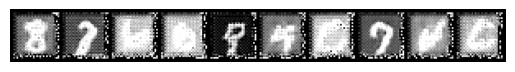

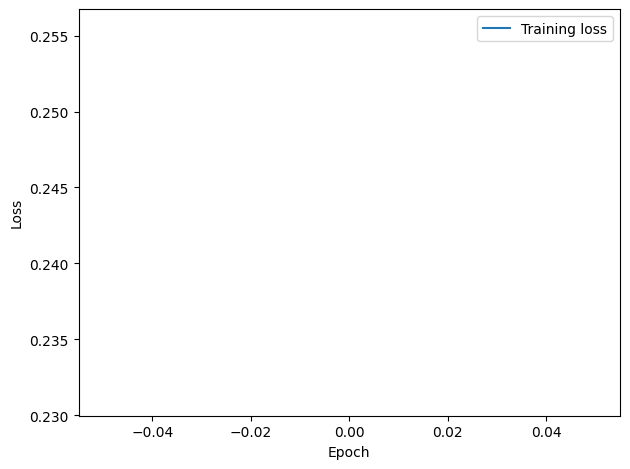

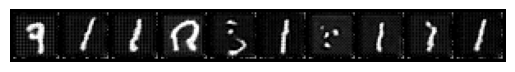

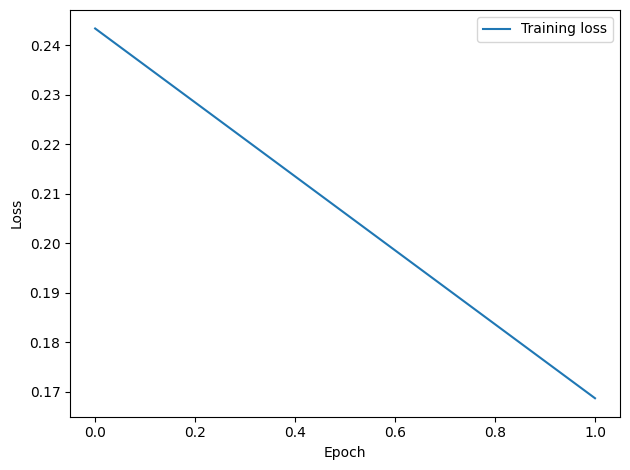

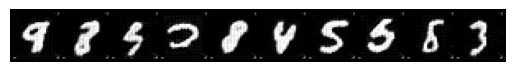

...

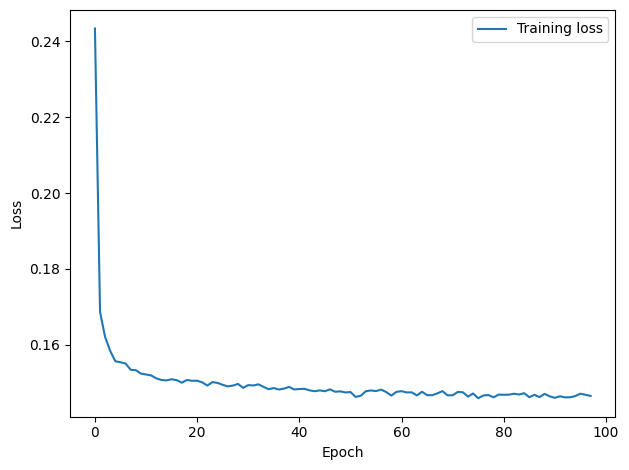

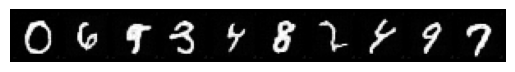

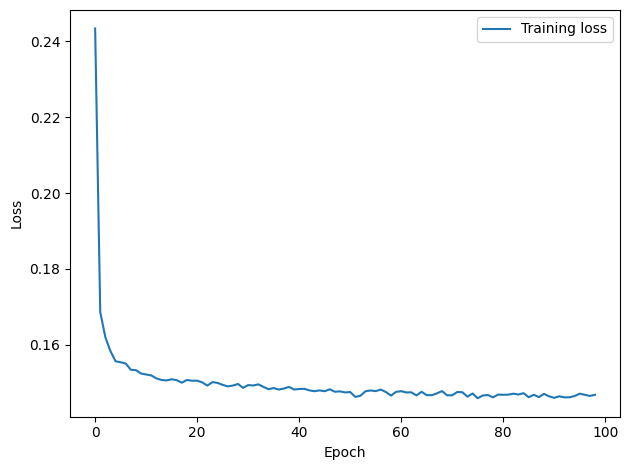

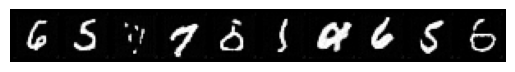

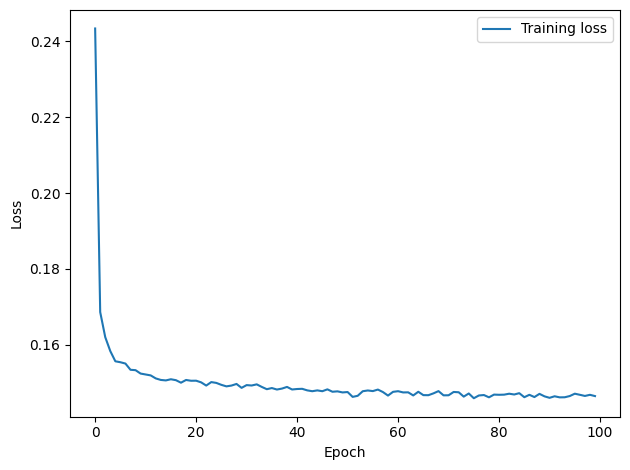

In [ ]:
model_x0 = DDPM(mnist_unet, T = T, mode = 'x0').to(device)

print("Training in mode: x0")
optimizer = torch.optim.Adam(model_x0.parameters(), lr=1e-3)
scheduler = torch.optim.lr_scheduler.ExponentialLR(optimizer, 0.9999)
train(model_x0, optimizer, scheduler, dataloader_train, epochs = epochs, device = device, ema = True, per_epoch_callback = reporter())

Training in mode: epsilon


Training:   0%|          | 0/23500 [00:00<?, ?it/s]

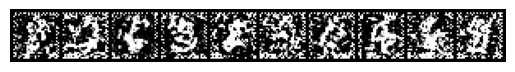

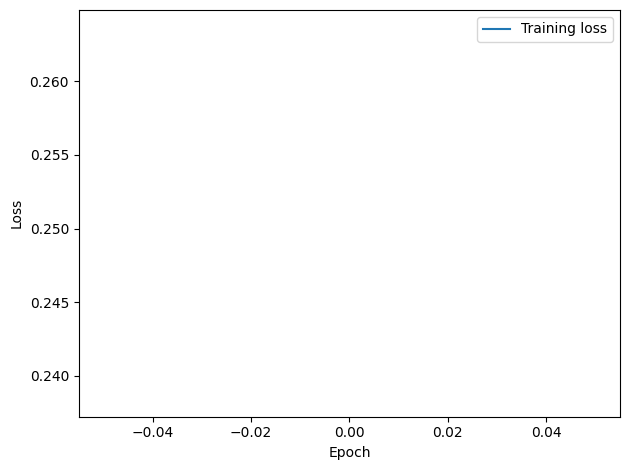

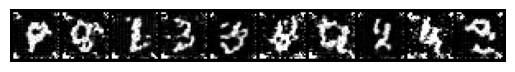

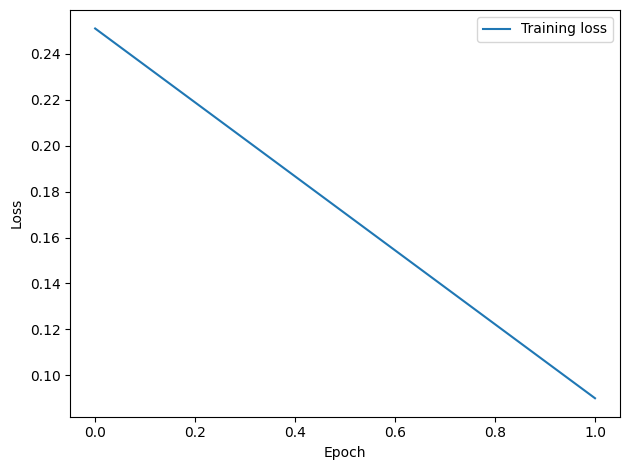

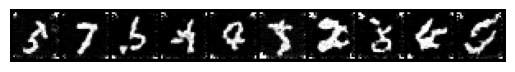

...

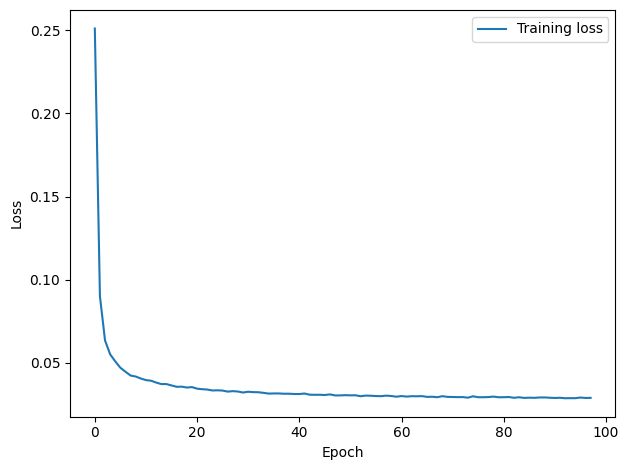

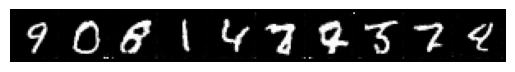

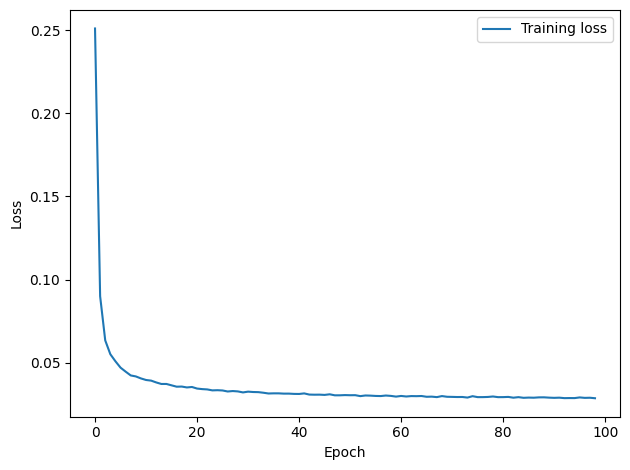

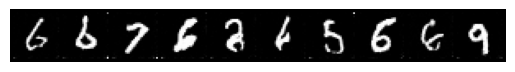

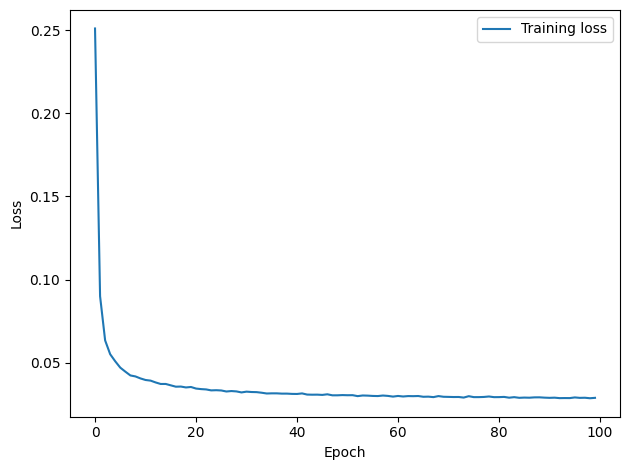

In [ ]:
model_noise = DDPM(mnist_unet, T = T, mode = 'epsilon').to(device)

print("Training in mode: epsilon")
optimizer = torch.optim.Adam(model_noise.parameters(), lr=learning_rate)
scheduler = torch.optim.lr_scheduler.ExponentialLR(optimizer, 0.9999)
train(model_noise, optimizer, scheduler, dataloader_train, epochs = epochs, device = device, ema = True, per_epoch_callback = reporter())

## Model comparison

In [ ]:
def calculate_inception_score(model, device, num_samples=500, batch_size=64, splits=10):

    from torchvision.models import inception_v3, Inception_V3_Weights
    from torchvision import transforms
    import torch
    import numpy as np
    from scipy import linalg
    from scipy.stats import entropy
    from tqdm.auto import tqdm

    # Load InceptionV3 model with updated weights parameter
    inception = inception_v3(weights=Inception_V3_Weights.IMAGENET1K_V1, transform_input=False).to(device)
    inception.eval()

    # Disable gradients
    for param in inception.parameters():
        param.requires_grad = False

    # Define preprocessing transforms
    preprocess = transforms.Compose([
        transforms.Resize((299, 299)),
        transforms.Normalize(mean=[0.485, 0.456, 0.406],
                             std=[0.229, 0.224, 0.225]),
    ])

    def get_predictions(images):
        # Convert grayscale to RGB by repeating channels
        images = images.repeat(1, 3, 1, 1)  # Shape: (batch_size, 3, 28, 28)

        # Apply preprocessing transforms
        images = preprocess(images)  # Shape: (batch_size, 3, 299, 299)

        # Pass through InceptionV3
        with torch.no_grad():
            preds = inception(images)
            preds = torch.nn.functional.softmax(preds, dim=1)

        return preds.cpu().numpy()

    # Generate samples and collect predictions
    preds = []
    model.eval()
    with torch.no_grad():
        for _ in tqdm(range(0, num_samples, batch_size), desc="Calculating Inception Score"):
            current_batch_size = min(batch_size, num_samples - len(preds))
            samples = model.sample((current_batch_size, 784)).to(device)
            samples = samples.view(-1, 1, 28, 28)  # Shape: (batch_size, 1, 28, 28)
            batch_preds = get_predictions(samples)
            preds.append(batch_preds)
    preds = np.concatenate(preds, axis=0)

    # Compute Inception Score
    split_scores = []
    for k in range(splits):
        part = preds[k * (num_samples // splits): (k + 1) * (num_samples // splits), :]
        py = np.mean(part, axis=0)
        scores = []
        for i in range(part.shape[0]):
            pyx = part[i]
            scores.append(entropy(pyx, py))
        split_scores.append(np.exp(np.mean(scores)))

    return np.mean(split_scores), np.std(split_scores)


In [ ]:
inception_x0 = calculate_inception_score(model_x0, device = "cuda:0", num_samples=500, batch_size=64, splits=10)


Calculating Inception Score:   0%|          | 0/8 [00:00<?, ?it/s]

In [ ]:
inception_noise = calculate_inception_score(model_noise, device = "cuda:0", num_samples=500, batch_size=64, splits=10)


Calculating Inception Score:   0%|          | 0/8 [00:00<?, ?it/s]

In [ ]:
print(f"inception score for x0 model: {inception_x0}, inception score for noise model: {inception_noise}")

inception score for x0 model: (1.1733677, 0.041662384), inception score for noise model: (1.1841336, 0.026712336)
